In [2]:
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import datetime as dt
import warnings
import plotly.graph_objects as go
from nltk.stem.porter import PorterStemmer
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, classification_report, roc_auc_score,roc_curve,auc, precision_score,recall_score
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, classification_report, roc_auc_score,roc_curve,auc

In [3]:
df = pd.read_csv('Amazon Sale Report.csv',index_col = 'index')
df

,Order ID,Date,Status,Fulfilment,Sales Channel,ship-service-level,Style,SKU,Category,Size,...,currency,Amount,ship-city,ship-state,ship-postal-code,ship-country,promotion-ids,B2B,fulfilled-by,Unnamed: 22
index,,,,,,,,,,,,,,,,,,,,,
0,405-8078784-5731545,4/30/2022,Cancelled,Merchant,Amazon.in,Standard,SET389,SET389-KR-NP-S,Set,S,...,INR,647.62,MUMBAI,MAHARASHTRA,400081.0,IN,NaN,False,Easy Ship,NaN
1,171-9198151-1101146,4/30/2022,Shipped - Delivered to Buyer,Merchant,Amazon.in,Standard,JNE3781,JNE3781-KR-XXXL,kurta,3XL,...,INR,406.00,BENGALURU,KARNATAKA,560085.0,IN,Amazon PLCC Free-Financing Universal Merchant ...,False,Easy Ship,NaN
2,404-0687676-7273146,4/30/2022,Shipped,Amazon,Amazon.in,Expedited,JNE3371,JNE3371-KR-XL,kurta,XL,...,INR,329.00,NAVI MUMBAI,MAHARASHTRA,410210.0,IN,IN Core Free Shipping 2015/04/08 23-48-5-108,True,NaN,NaN
3,403-9615377-8133951,4/30/2022,Cancelled,Merchant,Amazon.in,Standard,J0341,J0341-DR-L,Western Dress,L,...,INR,753.33,PUDUCHERRY,PUDUCHERRY,605008.0,IN,NaN,False,Easy Ship,NaN
4,407-1069790-7240320,4/30/2022,Shipped,Amazon,Amazon.in,Expedited,JNE3671,JNE3671-TU-XXXL,Top,3XL,...,INR,574.00,CHENNAI,TAMIL NADU,600073.0,IN,NaN,False,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
128970,406-6001380-7673107,5/31/2022,Shipped,Amazon,Amazon.in,Expedited,JNE3697,JNE3697-KR-XL,kurta,XL,...,INR,517.00,HYDERABAD,TELANGANA,500013.0,IN,NaN,False,NaN,False
128971,402-9551604-7544318,5/31/2022,Shipped,Amazon,Amazon.in,Expedited,SET401,SET401-KR-NP-M,Set,M,...,INR,999.00,GURUGRAM,HARYANA,122004.0,IN,IN Core Free Shipping 2015/04/08 23-48-5-108,False,NaN,False
128972,407-9547469-3152358,5/31/2022,Shipped,Amazon,Amazon.in,Expedited,J0157,J0157-DR-XXL,Western Dress,XXL,...,INR,690.00,HYDERABAD,TELANGANA,500049.0,IN,NaN,False,NaN,False


In [4]:
df.shape

(128975, 23)

In [5]:
df.drop_duplicates('Order ID',inplace=True)

In [6]:
df.isnull().sum()/128975

Order ID              0.000000
Date                  0.000000
Status                0.000000
Fulfilment            0.000000
Sales Channel         0.000000
ship-service-level    0.000000
Style                 0.000000
SKU                   0.000000
Category              0.000000
Size                  0.000000
ASIN                  0.000000
Courier Status        0.049521
Qty                   0.000000
currency              0.057383
Amount                0.057383
ship-city             0.000217
ship-state            0.000217
ship-postal-code      0.000217
ship-country          0.000217
promotion-ids         0.363846
B2B                   0.000000
fulfilled-by          0.651305
Unnamed: 22           0.355418
dtype: float64

In [7]:
df=df.drop(['fulfilled-by','Unnamed: 22','promotion-ids','Order ID','Date','SKU','currency','ship-postal-code','ASIN','Style'], axis=1)

In [8]:
df.isnull().sum()

Status                   0
Fulfilment               0
Sales Channel            0
ship-service-level       0
Category                 0
Size                     0
Courier Status        6387
Qty                      0
Amount                7401
ship-city               28
ship-state              28
ship-country            28
B2B                      0
dtype: int64

In [9]:
df= df.dropna(subset=["Courier Status"])

In [10]:
df["Courier Status"].unique()

array(['Shipped', 'Cancelled', 'Unshipped'], dtype=object)

In [11]:
df["Status"].unique()

array(['Shipped - Delivered to Buyer', 'Shipped', 'Cancelled',
       'Shipped - Returned to Seller', 'Shipped - Rejected by Buyer',
       'Shipped - Lost in Transit', 'Shipped - Out for Delivery',
       'Shipped - Returning to Seller', 'Shipped - Picked Up', 'Pending',
       'Pending - Waiting for Pick Up', 'Shipped - Damaged', 'Shipping'],
      dtype=object)

In [12]:
df2=df.copy()

In [13]:
ds_null_Amount=df2.loc[df2.Amount.isnull()]
ds_null_Amount=pd.DataFrame(ds_null_Amount)

In [14]:
nonA =df2.loc [df2['Sales Channel ']=='Non-Amazon']


In [15]:
df.shape

(113991, 13)

In [16]:
df=df.dropna()

In [17]:
df.isna().sum()

Status                0
Fulfilment            0
Sales Channel         0
ship-service-level    0
Category              0
Size                  0
Courier Status        0
Qty                   0
Amount                0
ship-city             0
ship-state            0
ship-country          0
B2B                   0
dtype: int64

In [18]:
full2=pd.concat([df, nonA,ds_null_Amount], axis=0)
full2

,Status,Fulfilment,Sales Channel,ship-service-level,Category,Size,Courier Status,Qty,Amount,ship-city,ship-state,ship-country,B2B
index,,,,,,,,,,,,,
1,Shipped - Delivered to Buyer,Merchant,Amazon.in,Standard,kurta,3XL,Shipped,1,406.0,BENGALURU,KARNATAKA,IN,False
2,Shipped,Amazon,Amazon.in,Expedited,kurta,XL,Shipped,1,329.0,NAVI MUMBAI,MAHARASHTRA,IN,True
4,Shipped,Amazon,Amazon.in,Expedited,Top,3XL,Shipped,1,574.0,CHENNAI,TAMIL NADU,IN,False
5,Shipped,Amazon,Amazon.in,Expedited,Set,XL,Shipped,1,824.0,GHAZIABAD,UTTAR PRADESH,IN,False
6,Shipped,Amazon,Amazon.in,Expedited,Set,L,Shipped,1,653.0,CHANDIGARH,CHANDIGARH,IN,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
128902,Cancelled,Amazon,Amazon.in,Expedited,Western Dress,L,Cancelled,0,NaN,ANANTAPUR,ANDHRA PRADESH,IN,False
128903,Cancelled,Amazon,Amazon.in,Expedited,kurta,M,Cancelled,0,NaN,ANANTAPUR,ANDHRA PRADESH,IN,False
128907,Cancelled,Amazon,Amazon.in,Expedited,Set,3XL,Cancelled,0,NaN,GREATER NOIDA,UTTAR PRADESH,IN,False


In [19]:
full2 = full2.fillna(0)

In [20]:
full2.isna().sum()

Status                0
Fulfilment            0
Sales Channel         0
ship-service-level    0
Category              0
Size                  0
Courier Status        0
Qty                   0
Amount                0
ship-city             0
ship-state            0
ship-country          0
B2B                   0
dtype: int64

In [21]:
full2.describe()

,Qty,Amount
count,114091.000000,114091.000000
mean,0.954650,617.401197
std,0.242539,310.765017
min,0.000000,0.000000
25%,1.000000,429.000000
50%,1.000000,597.000000
75%,1.000000,776.000000
max,15.000000,5495.000000


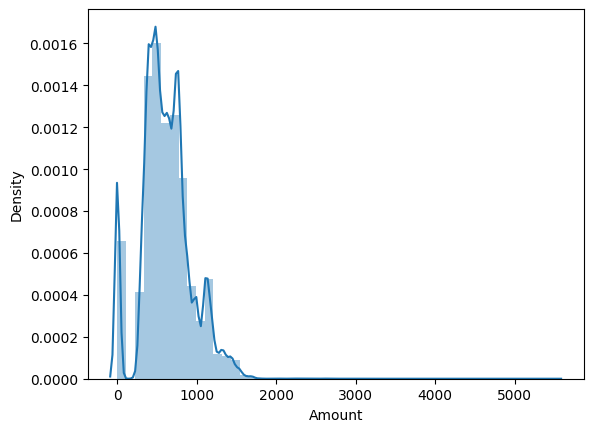

In [22]:
# plotting the distribution

sns.distplot(full2['Amount'])

plt.show()

In [23]:
import scipy.stats as stats
full2['AmountR'] = np.sqrt(full2['Amount'])
full2['Amountz'] = stats.zscore(full2['AmountR'])

In [24]:
full2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 114091 entries, 1 to 128967
Data columns (total 15 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Status              114091 non-null  object 
 1   Fulfilment          114091 non-null  object 
 2   Sales Channel       114091 non-null  object 
 3   ship-service-level  114091 non-null  object 
 4   Category            114091 non-null  object 
 5   Size                114091 non-null  object 
 6   Courier Status      114091 non-null  object 
 7   Qty                 114091 non-null  int64  
 8   Amount              114091 non-null  float64
 9   ship-city           114091 non-null  object 
 10  ship-state          114091 non-null  object 
 11  ship-country        114091 non-null  object 
 12  B2B                 114091 non-null  bool   
 13  AmountR             114091 non-null  float64
 14  Amountz             114091 non-null  float64
dtypes: bool(1), float64(3), int64(1), objec

In [25]:
full2['Courier Status'].unique()

array(['Shipped', 'Unshipped', 'Cancelled'], dtype=object)

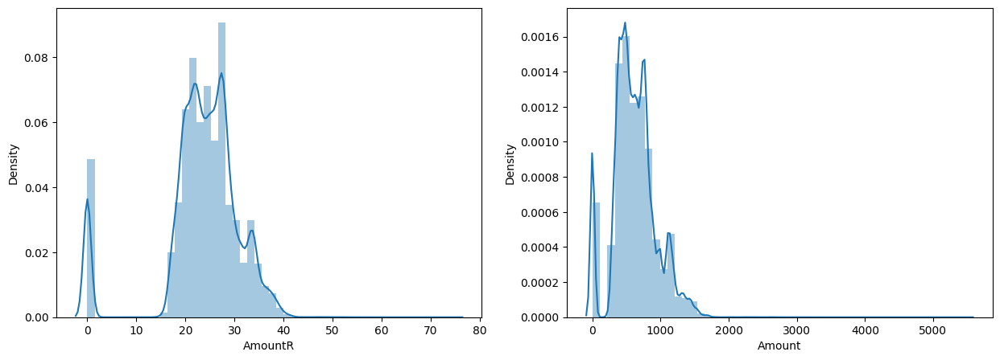

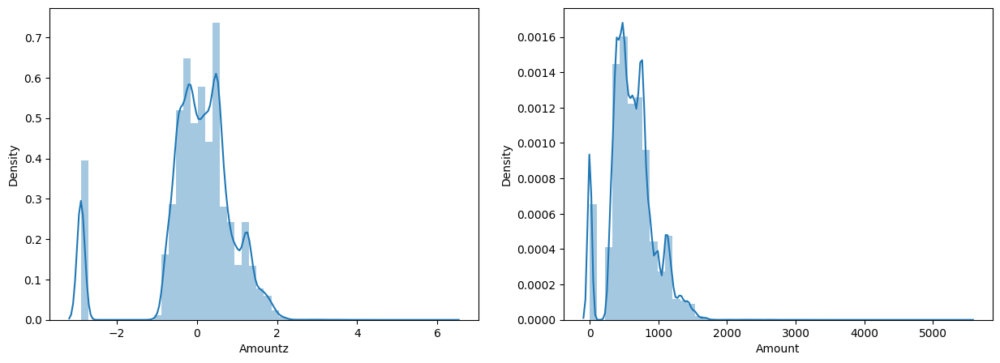

In [26]:

fig, axes = plt.subplots(1,2, figsize=(15,5))
sns.distplot(full2['AmountR'], ax=axes[0])
sns.distplot(full2['Amount'], ax=axes[1])
plt.show()

fig, axes = plt.subplots(1,2, figsize=(15,5))
sns.distplot(full2['Amountz'], ax=axes[0])
sns.distplot(full2['Amount'], ax=axes[1])
plt.show()

# ***NO remove for outliers it will impact on courier satuts (Cancelled it will Amount zero)***

In [27]:
full2=full2.drop(['AmountR','Amountz'],axis=1)

In [28]:
full2.columns

Index(['Status', 'Fulfilment', 'Sales Channel ', 'ship-service-level',
       'Category', 'Size', 'Courier Status', 'Qty', 'Amount', 'ship-city',
       'ship-state', 'ship-country', 'B2B'],
      dtype='object')

In [29]:
full2.columns

Index(['Status', 'Fulfilment', 'Sales Channel ', 'ship-service-level',
       'Category', 'Size', 'Courier Status', 'Qty', 'Amount', 'ship-city',
       'ship-state', 'ship-country', 'B2B'],
      dtype='object')

In [30]:
full2.shape

(114091, 13)

In [31]:
full2

,Status,Fulfilment,Sales Channel,ship-service-level,Category,Size,Courier Status,Qty,Amount,ship-city,ship-state,ship-country,B2B
index,,,,,,,,,,,,,
1,Shipped - Delivered to Buyer,Merchant,Amazon.in,Standard,kurta,3XL,Shipped,1,406.0,BENGALURU,KARNATAKA,IN,False
2,Shipped,Amazon,Amazon.in,Expedited,kurta,XL,Shipped,1,329.0,NAVI MUMBAI,MAHARASHTRA,IN,True
4,Shipped,Amazon,Amazon.in,Expedited,Top,3XL,Shipped,1,574.0,CHENNAI,TAMIL NADU,IN,False
5,Shipped,Amazon,Amazon.in,Expedited,Set,XL,Shipped,1,824.0,GHAZIABAD,UTTAR PRADESH,IN,False
6,Shipped,Amazon,Amazon.in,Expedited,Set,L,Shipped,1,653.0,CHANDIGARH,CHANDIGARH,IN,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
128902,Cancelled,Amazon,Amazon.in,Expedited,Western Dress,L,Cancelled,0,0.0,ANANTAPUR,ANDHRA PRADESH,IN,False
128903,Cancelled,Amazon,Amazon.in,Expedited,kurta,M,Cancelled,0,0.0,ANANTAPUR,ANDHRA PRADESH,IN,False
128907,Cancelled,Amazon,Amazon.in,Expedited,Set,3XL,Cancelled,0,0.0,GREATER NOIDA,UTTAR PRADESH,IN,False


In [32]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder

In [33]:
scaler = MinMaxScaler()
full2['Amount_Scaled'] = scaler.fit_transform(full2['Amount'].values.reshape(-1, 1)) # Reshape the 'Amount' column to a 2D array

full2['Amount_Scaled']


index
1         0.073885
2         0.059873
4         0.104459
5         0.149955
6         0.118835
            ...   
128902    0.000000
128903    0.000000
128907    0.000000
128958    0.000000
128967    0.000000
Name: Amount_Scaled, Length: 114091, dtype: float64

In [34]:
full2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 114091 entries, 1 to 128967
Data columns (total 14 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Status              114091 non-null  object 
 1   Fulfilment          114091 non-null  object 
 2   Sales Channel       114091 non-null  object 
 3   ship-service-level  114091 non-null  object 
 4   Category            114091 non-null  object 
 5   Size                114091 non-null  object 
 6   Courier Status      114091 non-null  object 
 7   Qty                 114091 non-null  int64  
 8   Amount              114091 non-null  float64
 9   ship-city           114091 non-null  object 
 10  ship-state          114091 non-null  object 
 11  ship-country        114091 non-null  object 
 12  B2B                 114091 non-null  bool   
 13  Amount_Scaled       114091 non-null  float64
dtypes: bool(1), float64(2), int64(1), object(10)
memory usage: 12.3+ MB


In [35]:
full2.isna().sum()

Status                0
Fulfilment            0
Sales Channel         0
ship-service-level    0
Category              0
Size                  0
Courier Status        0
Qty                   0
Amount                0
ship-city             0
ship-state            0
ship-country          0
B2B                   0
Amount_Scaled         0
dtype: int64

In [36]:
full2.columns

Index(['Status', 'Fulfilment', 'Sales Channel ', 'ship-service-level',
       'Category', 'Size', 'Courier Status', 'Qty', 'Amount', 'ship-city',
       'ship-state', 'ship-country', 'B2B', 'Amount_Scaled'],
      dtype='object')

In [37]:
full2['Status'].unique()

array(['Shipped - Delivered to Buyer', 'Shipped', 'Cancelled',
       'Shipped - Returned to Seller', 'Shipped - Rejected by Buyer',
       'Shipped - Lost in Transit', 'Shipped - Out for Delivery',
       'Shipped - Returning to Seller', 'Shipped - Picked Up', 'Pending',
       'Pending - Waiting for Pick Up', 'Shipped - Damaged', 'Shipping'],
      dtype=object)

In [38]:
full2['Fulfilment'].unique()

array(['Merchant', 'Amazon'], dtype=object)

In [39]:
full2['Sales Channel '].unique()

array(['Amazon.in', 'Non-Amazon'], dtype=object)

In [40]:
full2['ship-service-level'].unique()

array(['Standard', 'Expedited'], dtype=object)

In [41]:
full2['Category'].unique()

array(['kurta', 'Top', 'Set', 'Western Dress', 'Ethnic Dress', 'Bottom',
       'Saree', 'Blouse', 'Dupatta'], dtype=object)

In [42]:
full2['Size'].unique()

array(['3XL', 'XL', 'L', 'S', 'XXL', 'XS', '6XL', 'M', '4XL', '5XL',
       'Free'], dtype=object)

In [43]:
full2['Courier Status'].unique()

array(['Shipped', 'Unshipped', 'Cancelled'], dtype=object)

In [44]:
full2['ship-city'].unique()

array(['BENGALURU', 'NAVI MUMBAI', 'CHENNAI', ..., 'Pune 411006',
       'Dona Paula, Panaji', 'Bokaro steel city'], dtype=object)

In [45]:
full2['ship-state'].unique()

array(['KARNATAKA', 'MAHARASHTRA', 'TAMIL NADU', 'UTTAR PRADESH',
       'CHANDIGARH', 'TELANGANA', 'ANDHRA PRADESH', 'RAJASTHAN', 'DELHI',
       'HARYANA', 'ASSAM', 'JHARKHAND', 'CHHATTISGARH', 'ODISHA',
       'KERALA', 'MADHYA PRADESH', 'WEST BENGAL', 'NAGALAND', 'Gujarat',
       'UTTARAKHAND', 'BIHAR', 'JAMMU & KASHMIR', 'PUNJAB',
       'HIMACHAL PRADESH', 'ARUNACHAL PRADESH', 'MANIPUR', 'Goa',
       'MEGHALAYA', 'PUDUCHERRY', 'GOA', 'TRIPURA', 'LADAKH',
       'DADRA AND NAGAR', 'SIKKIM', 'Delhi', 'ANDAMAN & NICOBAR ',
       'Punjab', 'Manipur', 'rajasthan', 'Rajshthan', 'Odisha', 'NL',
       'Bihar', 'MIZORAM', 'punjab', 'New Delhi', 'Rajasthan',
       'Punjab/Mohali/Zirakpur', 'Puducherry', 'delhi', 'RJ',
       'Chandigarh', 'orissa', 'LAKSHADWEEP', 'goa', 'PB',
       'Arunachal Pradesh', 'AR', 'Pondicherry', 'Sikkim',
       'Arunachal pradesh', 'Nagaland', 'bihar', 'Mizoram', 'rajsthan',
       'Orissa', 'Rajsthan', 'APO', 0, 'Meghalaya'], dtype=object)

In [46]:
full2['ship-country'].unique()

array(['IN', 0], dtype=object)

In [47]:
full2['B2B'].unique()

array([False,  True])

In [48]:
LE = LabelEncoder()
LE_tips = LE.fit(full2[['Status']])
print(LE_tips.classes_)
print()
print(LE_tips.transform(['Shipped - Delivered to Buyer', 'Shipped', 'Cancelled']))
print()
print(LE_tips.inverse_transform([0,1,2,3,4,5,6,7,8,9,10,11]))

['Cancelled' 'Pending' 'Pending - Waiting for Pick Up' 'Shipped'
 'Shipped - Damaged' 'Shipped - Delivered to Buyer'
 'Shipped - Lost in Transit' 'Shipped - Out for Delivery'
 'Shipped - Picked Up' 'Shipped - Rejected by Buyer'
 'Shipped - Returned to Seller' 'Shipped - Returning to Seller' 'Shipping']

[5 3 0]

['Cancelled' 'Pending' 'Pending - Waiting for Pick Up' 'Shipped'
 'Shipped - Damaged' 'Shipped - Delivered to Buyer'
 'Shipped - Lost in Transit' 'Shipped - Out for Delivery'
 'Shipped - Picked Up' 'Shipped - Rejected by Buyer'
 'Shipped - Returned to Seller' 'Shipped - Returning to Seller']


In [49]:
LE = LabelEncoder()
LE_tips2= LE.fit(full2[['Fulfilment']])
print(LE_tips2.classes_)
print()
print(LE_tips2.transform(['Merchant', 'Amazon']))
print()
print(LE_tips2.inverse_transform([0,1]))

['Amazon' 'Merchant']

[1 0]

['Amazon' 'Merchant']


In [50]:
LE = LabelEncoder()
LE_tips3 = LE.fit(full2[['Sales Channel ']])
print(LE_tips3.classes_)
print()
print(LE_tips3.transform(['Amazon.in']))
print()
print(LE_tips3.inverse_transform([0]))

['Amazon.in' 'Non-Amazon']

[0]

['Amazon.in']


In [51]:
LE = LabelEncoder()
LE_tips = LE.fit(full2[['ship-service-level']])
print(LE_tips.classes_)
print()
print(LE_tips.transform(['Standard', 'Expedited']))
print()
print(LE_tips.inverse_transform([0,1]))

['Expedited' 'Standard']

[1 0]

['Expedited' 'Standard']


In [52]:
LE = LabelEncoder()
LE_tips = LE.fit(full2[['Category']])
print(LE_tips.classes_)
print()
print(LE_tips.transform(['kurta', 'Top', 'Set', 'Western Dress', 'Ethnic Dress', 'Bottom',
       'Saree', 'Blouse', 'Dupatta']))
print()
print(LE_tips.inverse_transform([0,1,2,3,4,5,6,7,8]))

['Blouse' 'Bottom' 'Dupatta' 'Ethnic Dress' 'Saree' 'Set' 'Top'
 'Western Dress' 'kurta']

[8 6 5 7 3 1 4 0 2]

['Blouse' 'Bottom' 'Dupatta' 'Ethnic Dress' 'Saree' 'Set' 'Top'
 'Western Dress' 'kurta']


In [53]:
LE = LabelEncoder()
LE_tips = LE.fit(full2[['Size']])
print(LE_tips.classes_)
print()
print(LE_tips.transform(['3XL', 'XL', 'L', 'S', 'XXL', 'XS', '6XL', 'M', '4XL', '5XL',
       'Free']))
print()
print(LE_tips.inverse_transform([0,1,2,3,4,5,6,7,8,9,10]))

['3XL' '4XL' '5XL' '6XL' 'Free' 'L' 'M' 'S' 'XL' 'XS' 'XXL']

[ 0  8  5  7 10  9  3  6  1  2  4]

['3XL' '4XL' '5XL' '6XL' 'Free' 'L' 'M' 'S' 'XL' 'XS' 'XXL']


In [54]:
LE = LabelEncoder()
LE_tips = LE.fit(full2[['Size']])
print(LE_tips.classes_)
print()
print(LE_tips.transform(full2[['Size']])) # Pass the column to be transformed
print()
print(LE_tips.inverse_transform(LE_tips.transform(full2[['Size']])))

['3XL' '4XL' '5XL' '6XL' 'Free' 'L' 'M' 'S' 'XL' 'XS' 'XXL']

[0 8 0 ... 0 5 9]

['3XL' 'XL' '3XL' ... '3XL' 'L' 'XS']


In [55]:
LE = LabelEncoder()
full2['ship-city'] = full2['ship-city'].astype(str)
LE_tips = LE.fit(full2[['ship-city']])
print(LE_tips.classes_)
print()
print(LE_tips.transform(full2[['ship-city']])) # Pass the column to be transformed
print()
print(LE_tips.inverse_transform(LE_tips.transform(full2[['ship-city']]))) # Pass the transformed data to inverse_transform

['(Chikmagalur disterict).     (N.R pur thaluku)'
 '(Via Cuncolim)Quepem,South Goa' ',HYDERABAD' ... 'yellapur' 'zirakpur'
 'लखनऊ']

[ 754 5213 1426 ... 2506 1179 4095]

['BENGALURU' 'NAVI MUMBAI' 'CHENNAI' ... 'GREATER NOIDA' 'Bengaluru'
 'Kolkata']


In [56]:
LE = LabelEncoder()
full2['ship-country'] = full2['ship-country'].astype(str)
LE_tips = LE.fit(full2[['ship-country']])
print(LE_tips.classes_)
print()
print(LE_tips.transform(full2[['ship-country']])) # Pass the column to be transformed
print()
print(LE_tips.inverse_transform(LE_tips.transform(full2[['ship-country']])))

['0' 'IN']

[1 1 1 ... 1 1 1]

['IN' 'IN' 'IN' ... 'IN' 'IN' 'IN']


In [57]:
LE = LabelEncoder()
full2['ship-state'] = full2['ship-state'].astype(str)
LE_tips = LE.fit(full2[['ship-state']])
print(LE_tips.classes_)
print()
print(LE_tips.transform(full2[['ship-state']])) # Pass the column to be transformed
print()
print(LE_tips.inverse_transform(LE_tips.transform(full2[['ship-state']])))

['0' 'ANDAMAN & NICOBAR ' 'ANDHRA PRADESH' 'APO' 'AR' 'ARUNACHAL PRADESH'
 'ASSAM' 'Arunachal Pradesh' 'Arunachal pradesh' 'BIHAR' 'Bihar'
 'CHANDIGARH' 'CHHATTISGARH' 'Chandigarh' 'DADRA AND NAGAR' 'DELHI'
 'Delhi' 'GOA' 'Goa' 'Gujarat' 'HARYANA' 'HIMACHAL PRADESH'
 'JAMMU & KASHMIR' 'JHARKHAND' 'KARNATAKA' 'KERALA' 'LADAKH' 'LAKSHADWEEP'
 'MADHYA PRADESH' 'MAHARASHTRA' 'MANIPUR' 'MEGHALAYA' 'MIZORAM' 'Manipur'
 'Meghalaya' 'Mizoram' 'NAGALAND' 'NL' 'Nagaland' 'New Delhi' 'ODISHA'
 'Odisha' 'Orissa' 'PB' 'PUDUCHERRY' 'PUNJAB' 'Pondicherry' 'Puducherry'
 'Punjab' 'Punjab/Mohali/Zirakpur' 'RAJASTHAN' 'RJ' 'Rajasthan'
 'Rajshthan' 'Rajsthan' 'SIKKIM' 'Sikkim' 'TAMIL NADU' 'TELANGANA'
 'TRIPURA' 'UTTAR PRADESH' 'UTTARAKHAND' 'WEST BENGAL' 'bihar' 'delhi'
 'goa' 'orissa' 'punjab' 'rajasthan' 'rajsthan']

[24 29 57 ... 60 24 62]

['KARNATAKA' 'MAHARASHTRA' 'TAMIL NADU' ... 'UTTAR PRADESH' 'KARNATAKA'
 'WEST BENGAL']


In [58]:
LE = LabelEncoder()
full2['ship-country'] = full2['ship-country'].astype(str)
LE_tips = LE.fit(full2[['ship-country']])
print(LE_tips.classes_)
print()
print(LE_tips.transform(full2[['ship-country']])) # Pass the column to be transformed
print()
print(LE_tips.inverse_transform(LE_tips.transform(full2[['ship-country']])))

['0' 'IN']

[1 1 1 ... 1 1 1]

['IN' 'IN' 'IN' ... 'IN' 'IN' 'IN']


In [59]:
LE = LabelEncoder()
LE_tips = LE.fit(['True', 'False']) # Fit the encoder on the strings you want to transform
print(LE_tips.classes_)
print()
print(LE_tips.transform(['True','False']))
print()
print(LE_tips.inverse_transform([0,1]))

['False' 'True']

[1 0]

['False' 'True']


In [60]:
LE = LabelEncoder()
full2['Courier Status'] = full2['Courier Status'].astype(str)
LE_tips = LE.fit(full2[['Courier Status']])
print(LE_tips.classes_)
print()
print(LE_tips.transform(full2[['Courier Status']])) # Pass the column to be transformed
print()
print(LE_tips.inverse_transform(LE_tips.transform(full2[['Courier Status']])))

['Cancelled' 'Shipped' 'Unshipped']

[1 1 1 ... 0 0 0]

['Shipped' 'Shipped' 'Shipped' ... 'Cancelled' 'Cancelled' 'Cancelled']


In [61]:
full2

,Status,Fulfilment,Sales Channel,ship-service-level,Category,Size,Courier Status,Qty,Amount,ship-city,ship-state,ship-country,B2B,Amount_Scaled
index,,,,,,,,,,,,,,
1,Shipped - Delivered to Buyer,Merchant,Amazon.in,Standard,kurta,3XL,Shipped,1,406.0,BENGALURU,KARNATAKA,IN,False,0.073885
2,Shipped,Amazon,Amazon.in,Expedited,kurta,XL,Shipped,1,329.0,NAVI MUMBAI,MAHARASHTRA,IN,True,0.059873
4,Shipped,Amazon,Amazon.in,Expedited,Top,3XL,Shipped,1,574.0,CHENNAI,TAMIL NADU,IN,False,0.104459
5,Shipped,Amazon,Amazon.in,Expedited,Set,XL,Shipped,1,824.0,GHAZIABAD,UTTAR PRADESH,IN,False,0.149955
6,Shipped,Amazon,Amazon.in,Expedited,Set,L,Shipped,1,653.0,CHANDIGARH,CHANDIGARH,IN,False,0.118835
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
128902,Cancelled,Amazon,Amazon.in,Expedited,Western Dress,L,Cancelled,0,0.0,ANANTAPUR,ANDHRA PRADESH,IN,False,0.000000
128903,Cancelled,Amazon,Amazon.in,Expedited,kurta,M,Cancelled,0,0.0,ANANTAPUR,ANDHRA PRADESH,IN,False,0.000000
128907,Cancelled,Amazon,Amazon.in,Expedited,Set,3XL,Cancelled,0,0.0,GREATER NOIDA,UTTAR PRADESH,IN,False,0.000000


In [62]:
full2.columns

Index(['Status', 'Fulfilment', 'Sales Channel ', 'ship-service-level',
       'Category', 'Size', 'Courier Status', 'Qty', 'Amount', 'ship-city',
       'ship-state', 'ship-country', 'B2B', 'Amount_Scaled'],
      dtype='object')

In [63]:
LE = LabelEncoder()

categorical_columns =['Status', 'Fulfilment', 'Sales Channel ', 'ship-service-level',
       'Category', 'Size', 'Courier Status', 'ship-city',
       'ship-state', 'ship-country', 'B2B',]

for col in categorical_columns:
    full2[col] = LE.fit_transform(full2[col])

In [64]:
y=full2['Courier Status']
x=full2.drop(['Courier Status',"Amount"],axis=1)

In [65]:
x

,Status,Fulfilment,Sales Channel,ship-service-level,Category,Size,Qty,ship-city,ship-state,ship-country,B2B,Amount_Scaled
index,,,,,,,,,,,,
1,5,1,0,1,8,0,1,754,24,1,0,0.073885
2,3,0,0,0,8,8,1,5213,29,1,1,0.059873
4,3,0,0,0,6,0,1,1426,57,1,0,0.104459
5,3,0,0,0,5,8,1,2438,60,1,0,0.149955
6,3,0,0,0,5,5,1,1375,11,1,0,0.118835
...,...,...,...,...,...,...,...,...,...,...,...,...
128902,0,0,0,0,7,5,0,167,2,1,0,0.000000
128903,0,0,0,0,8,6,0,167,2,1,0,0.000000
128907,0,0,0,0,5,0,0,2506,60,1,0,0.000000


In [66]:
y.unique()

array([1, 2, 0])

In [67]:
## Splitting dataset into 70% Training and 20% Testing Data:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x,y,train_size=0.7, random_state =0)

# random_state ---> is seed -- fixing the sample selection for Training & Testing dataset

# check the dimensions of the train & test subset for

print("The shape of X_train is:", x_train.shape)
print("The shape of X_test is:", x_test.shape)

print('')
print("The shape of Y_train is:", y_train.shape)
print("The shape of Y_test is:", y_test.shape)

The shape of X_train is: (79863, 12)
The shape of X_test is: (34228, 12)

The shape of Y_train is: (79863,)
The shape of Y_test is: (34228,)


In [68]:
from sklearn import tree # Import the tree submodule from sklearn

clf_dt = tree.DecisionTreeClassifier(random_state=40)

In [69]:
clf_dt.fit(x_train,y_train)

DecisionTreeClassifier(random_state=40)

In [70]:
y_train_pred = clf_dt.predict(x_train)

In [71]:
y_test_pred = clf_dt.predict(x_test)

In [72]:
#Use accuracy metric from sklearn.metrics library
from sklearn import metrics
print('Accuracy Score on train data: ', metrics.accuracy_score(y_train, y_train_pred))
print('Accuracy Score on test data: ', metrics.accuracy_score(y_test, y_test_pred))

Accuracy Score on train data:  1.0
Accuracy Score on test data:  0.9998247049199486


Feature: Status, Importance: 0.7086241051525615
Feature: Fulfilment, Importance: 0.0
Feature: Sales Channel , Importance: 0.022819129395446818
Feature: ship-service-level, Importance: 0.0
Feature: Category, Importance: 0.0
Feature: Size, Importance: 8.696079396813449e-05
Feature: Qty, Importance: 0.26831464602179367
Feature: ship-city, Importance: 1.8208996264727974e-06
Feature: ship-state, Importance: 5.468088838993237e-07
Feature: ship-country, Importance: 0.0
Feature: B2B, Importance: 0.0
Feature: Amount_Scaled, Importance: 0.00015279092771971288


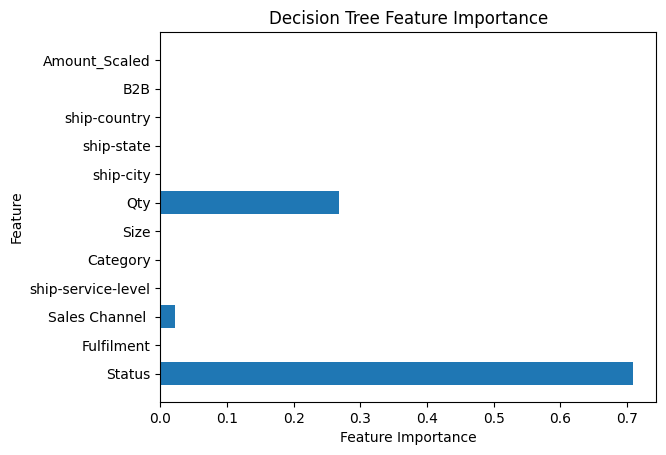

In [73]:
importances = clf_dt.feature_importances_

# Print feature importances
for feature, importance in zip(x.columns, importances):
    print(f"Feature: {feature}, Importance: {importance}")

# Visualize feature importances
import matplotlib.pyplot as plt
plt.barh(x.columns, importances)
plt.xlabel("Feature Importance")
plt.ylabel("Feature")
plt.title("Decision Tree Feature Importance")
plt.show()

In [74]:
x2=full2[['Qty','Sales Channel ','Status']]

In [75]:
## Splitting dataset into 70% Training and 20% Testing Data:
from sklearn.model_selection import train_test_split
x_train2, x_test2, y_train2, y_test2 = train_test_split(x2,y,train_size=0.7, random_state =0)

# random_state ---> is seed -- fixing the sample selection for Training & Testing dataset

# check the dimensions of the train & test subset for

print("The shape of X_train is:", x_train2.shape)
print("The shape of X_test is:", x_test2.shape)

print('')
print("The shape of Y_train is:", y_train2.shape)
print("The shape of Y_test is:", y_test2.shape)

The shape of X_train is: (79863, 3)
The shape of X_test is: (34228, 3)

The shape of Y_train is: (79863,)
The shape of Y_test is: (34228,)


In [76]:
clf_dt.fit(x_train2,y_train2)

DecisionTreeClassifier(random_state=40)

In [77]:
y_test_pred2 = clf_dt.predict(x_test2)

In [78]:
y_train_pred2 = clf_dt.predict(x_train2)

In [79]:
#Use accuracy metric from sklearn.metrics library
from sklearn import metrics
print('Accuracy Score on train data: ', metrics.accuracy_score(y_train2, y_train_pred2))
print('Accuracy Score on test data: ', metrics.accuracy_score(y_test2, y_test_pred2))

Accuracy Score on train data:  0.9999749571140578
Accuracy Score on test data:  0.9998831366132991


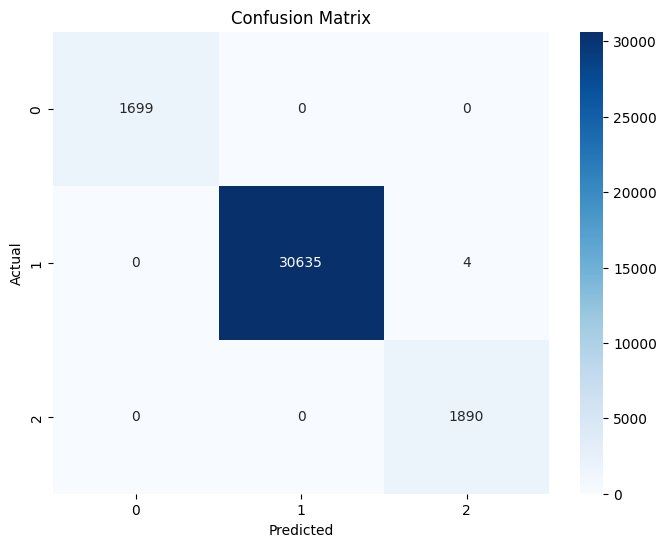

In [105]:
cm = confusion_matrix(y_test,y_test_pred2)

# Plot heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

<Figure size 640x480 with 0 Axes>

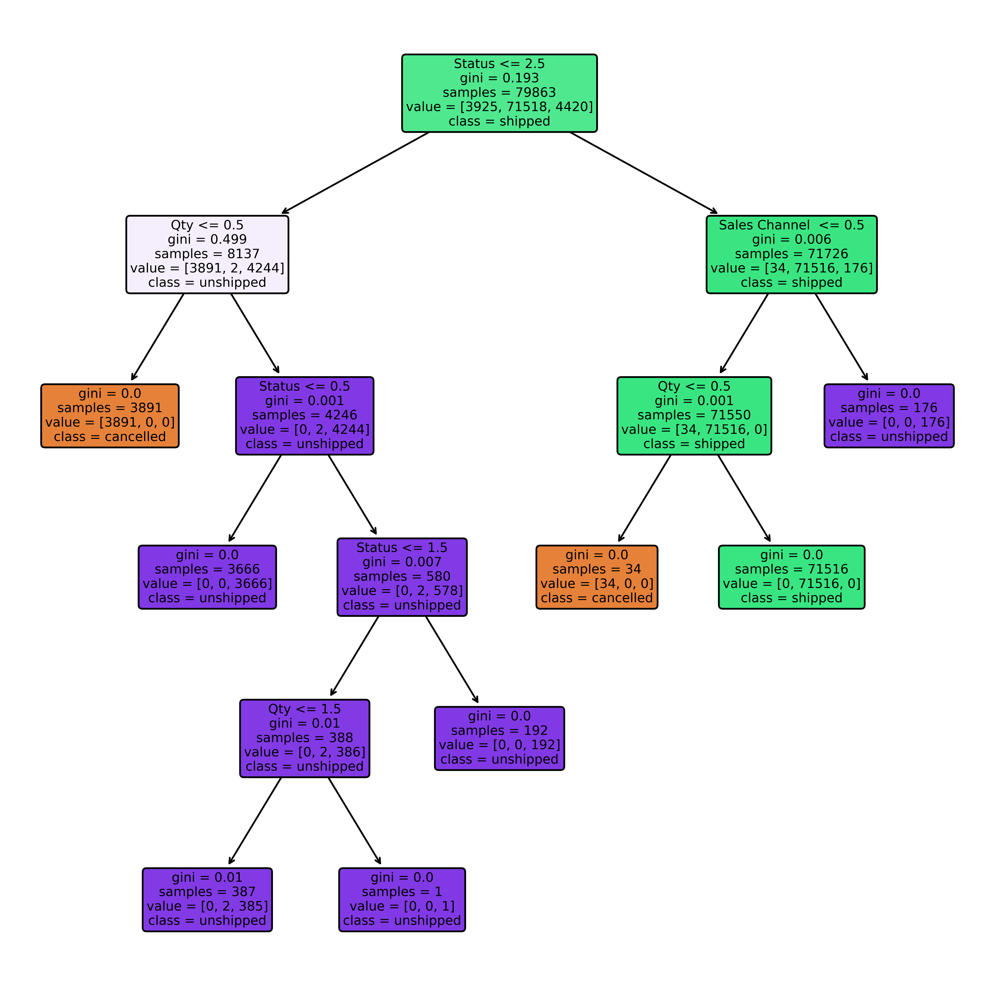

In [80]:
plt.figure()
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (10,10), dpi=800)
tree.plot_tree(clf_dt, feature_names = x2.columns.tolist(),
               class_names=['cancelled','shipped','unshipped'],
               filled = True,
              rounded=True)
plt.show()

In [81]:
clf=RandomForestClassifier(random_state=40)

#Train the model using the training sets
clf.fit(x_train,y_train)

RandomForestClassifier(random_state=40)

In [82]:
y_train_pred3 = clf.predict(x_train)
y_test_pred3 = clf.predict(x_test)

In [83]:
print('Accuracy Score on train data: ', metrics.accuracy_score(y_train, y_train_pred3))
print("Random Forest test Accuracy:", metrics.accuracy_score(y_test, y_test_pred3))

Accuracy Score on train data:  1.0
Random Forest test Accuracy: 0.9998539207666238


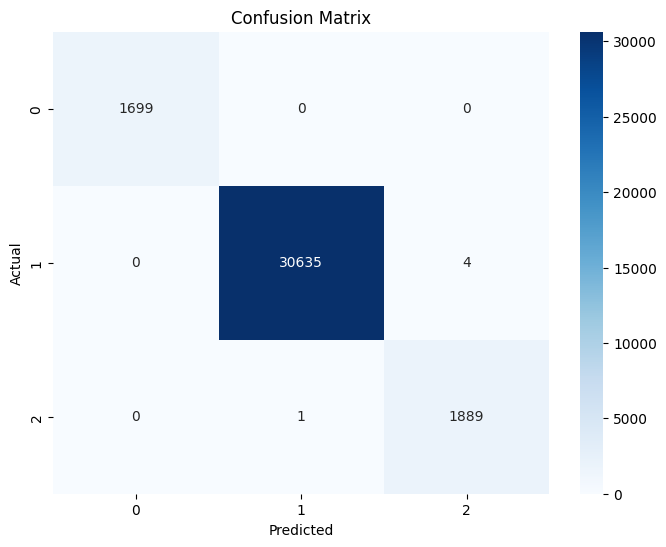

In [104]:
cm = confusion_matrix(y_test,y_test_pred3)

# Plot heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

In [84]:
def visualise_tree(tree_to_print):
    plt.figure()
    fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (10,10), dpi=800)
    tree.plot_tree(tree_to_print,
               feature_names = x.columns.tolist(),
               class_names=['cancelled','shipped','unshipped'],
               filled = True,
              rounded=True);
    plt.show()

<Figure size 640x480 with 0 Axes>

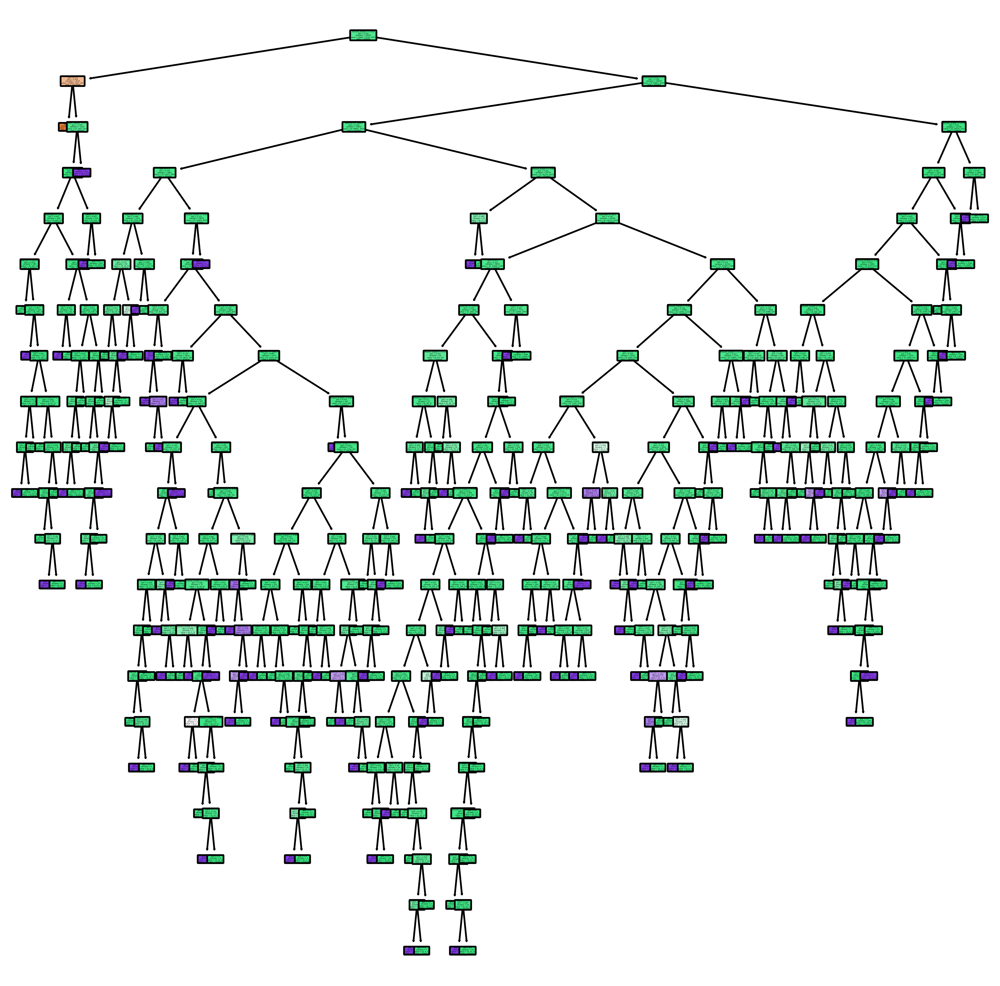

<Figure size 640x480 with 0 Axes>

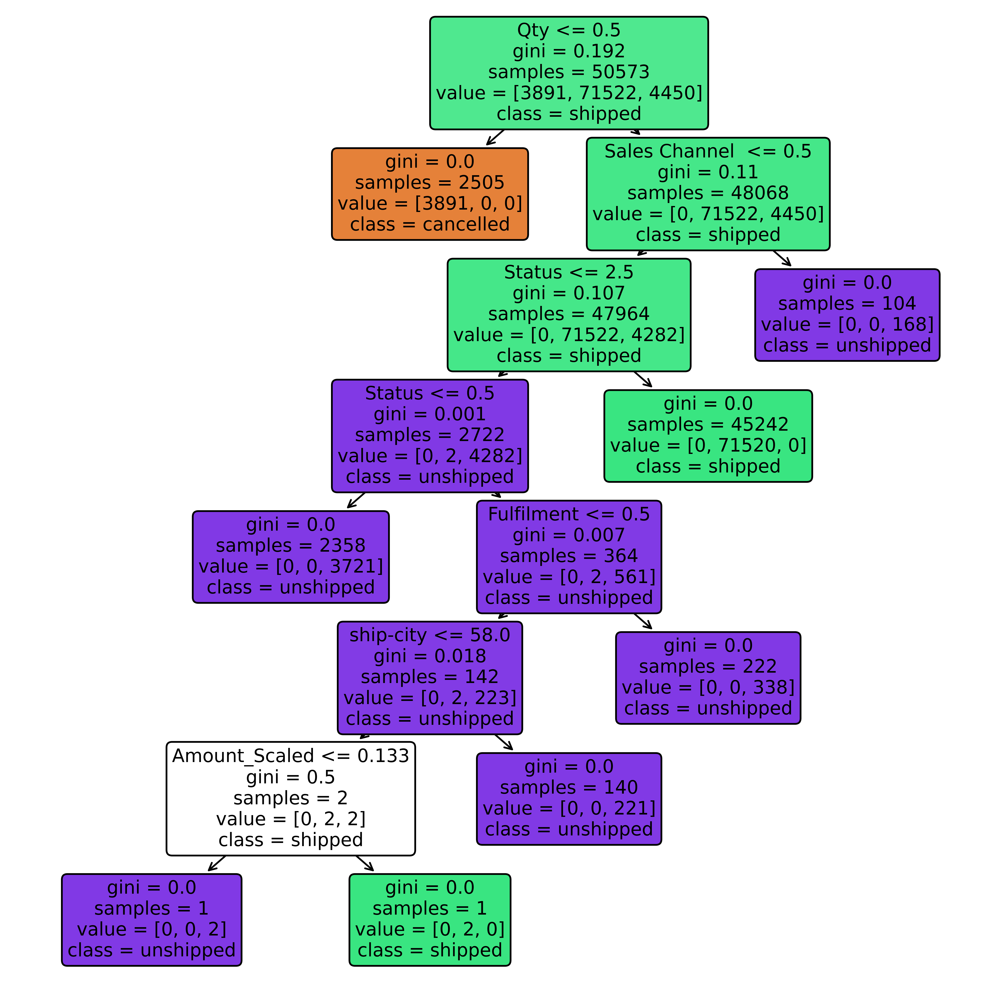

<Figure size 640x480 with 0 Axes>

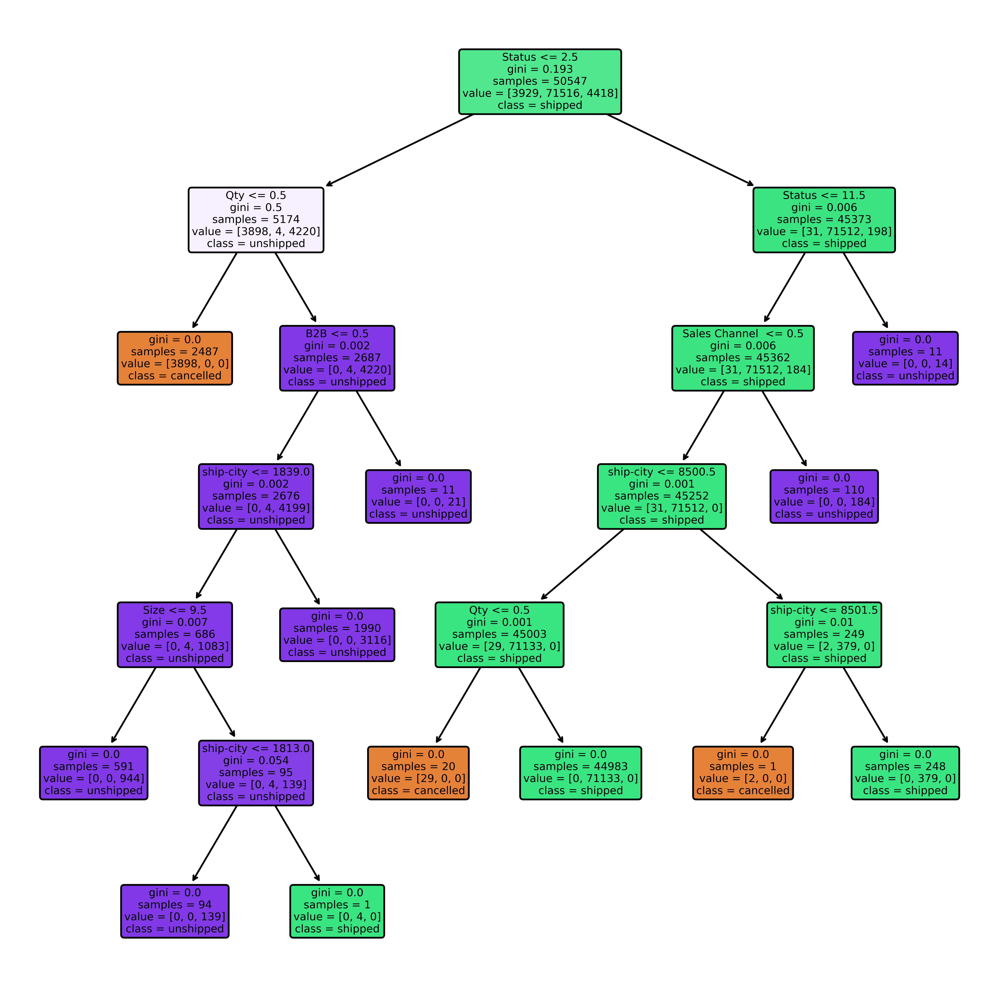

In [85]:
for index in range(0, 3):
    visualise_tree(clf.estimators_[index])

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11],
 [Text(0, 0, 'Status'),
  Text(1, 0, 'Qty'),
  Text(2, 0, 'Amount_Scaled'),
  Text(3, 0, 'Sales Channel '),
  Text(4, 0, 'ship-service-level'),
  Text(5, 0, 'Fulfilment'),
  Text(6, 0, 'ship-city'),
  Text(7, 0, 'ship-state'),
  Text(8, 0, 'Size'),
  Text(9, 0, 'Category'),
  Text(10, 0, 'B2B'),
  Text(11, 0, 'ship-country')])

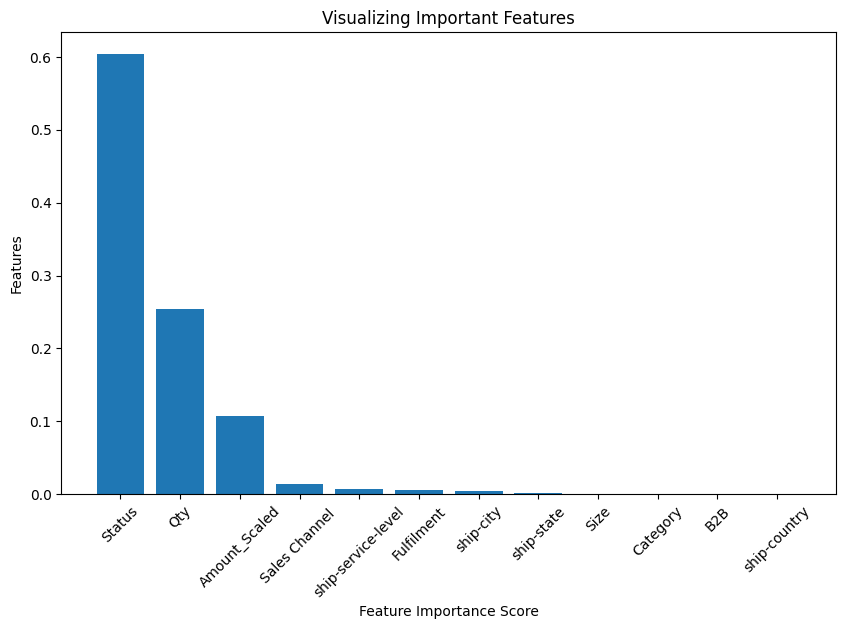

In [86]:
feature_imp = pd.Series(clf.feature_importances_, index=x.columns).sort_values(ascending=False)

plt.figure(figsize=(10,6))
plt.bar(feature_imp.index,feature_imp)

# Add labels to your graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Features");
plt.xticks(rotation=45)

In [87]:
x.columns

Index(['Status', 'Fulfilment', 'Sales Channel ', 'ship-service-level',
       'Category', 'Size', 'Qty', 'ship-city', 'ship-state', 'ship-country',
       'B2B', 'Amount_Scaled'],
      dtype='object')

In [88]:
x3=full2[['Qty','Sales Channel ','Status','Amount_Scaled','Sales Channel ','ship-service-level','Fulfilment','ship-city']]

In [89]:
## Splitting dataset into 70% Training and 20% Testing Data:
from sklearn.model_selection import train_test_split
x_train3, x_test3, y_train3, y_test3 = train_test_split(x3,y,train_size=0.7, random_state =0)

# random_state ---> is seed -- fixing the sample selection for Training & Testing dataset

# check the dimensions of the train & test subset for

print("The shape of X_train is:", x_train3.shape)
print("The shape of X_test is:", x_test3.shape)

print('')
print("The shape of Y_train is:", y_train3.shape)
print("The shape of Y_test is:", y_test3.shape)

The shape of X_train is: (79863, 8)
The shape of X_test is: (34228, 8)

The shape of Y_train is: (79863,)
The shape of Y_test is: (34228,)


In [90]:
clf=RandomForestClassifier(random_state=40)

#Train the model using the training sets
clf.fit(x_train3,y_train3)

RandomForestClassifier(random_state=40)

In [91]:
y_train_pred4 = clf.predict(x_train3)
y_test_pred4 = clf.predict(x_test3)

In [92]:
print('Accuracy Score on train data: ', metrics.accuracy_score(y_train, y_train_pred4))
print("Random Forest test Accuracy:", metrics.accuracy_score(y_test, y_test_pred4))

Accuracy Score on train data:  1.0
Random Forest test Accuracy: 0.9998539207666238


In [93]:
def visualise_tree(tree_to_print):
    plt.figure()
    fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (10,10), dpi=800)
    tree.plot_tree(tree_to_print,
               feature_names = x3.columns.tolist(),
               class_names=['cancelled','shipped','unshipped'],
               filled = True,
              rounded=True);
    plt.show()

<Figure size 640x480 with 0 Axes>

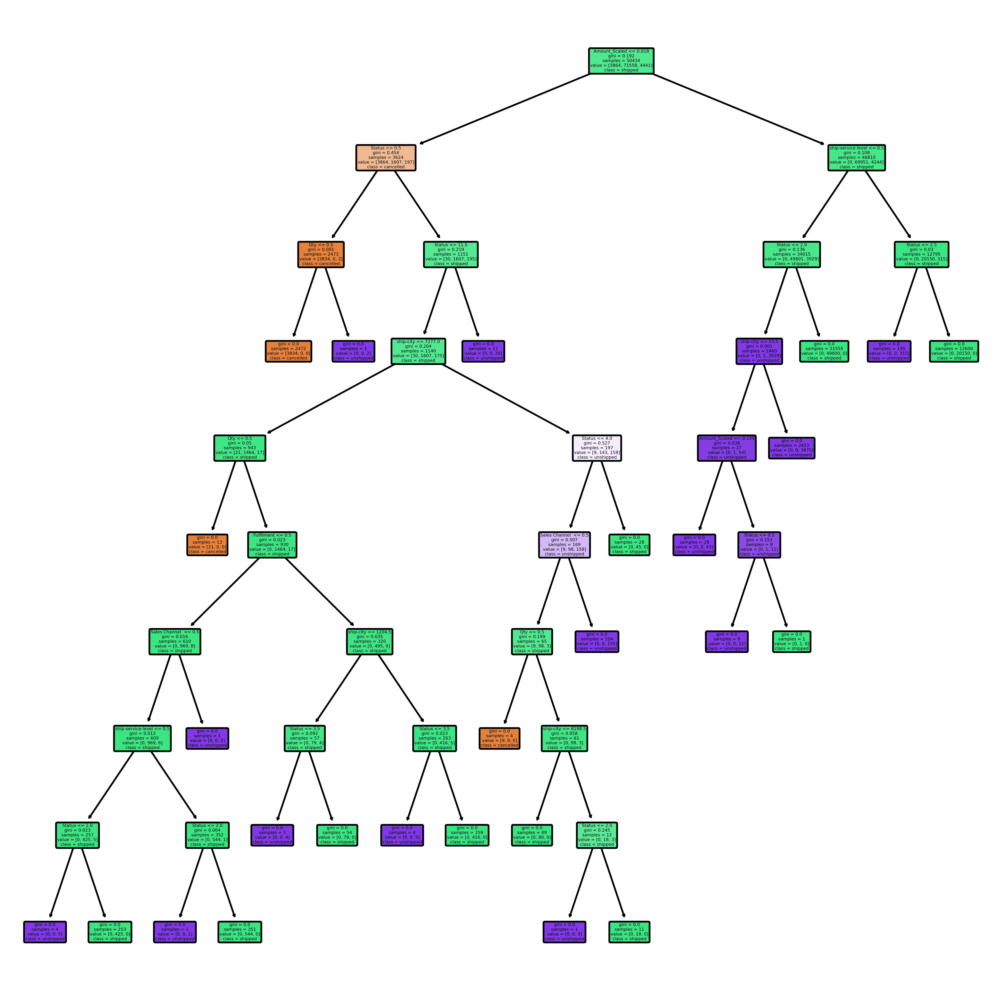

<Figure size 640x480 with 0 Axes>

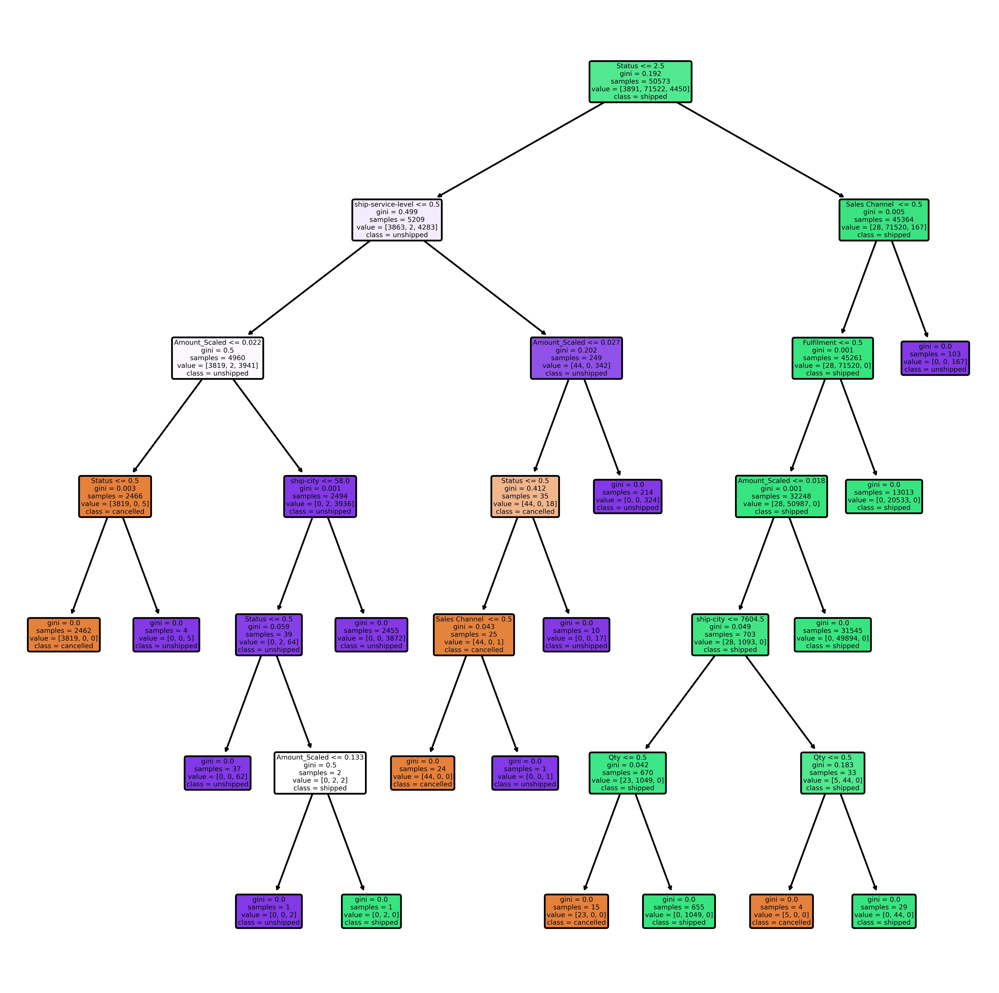

<Figure size 640x480 with 0 Axes>

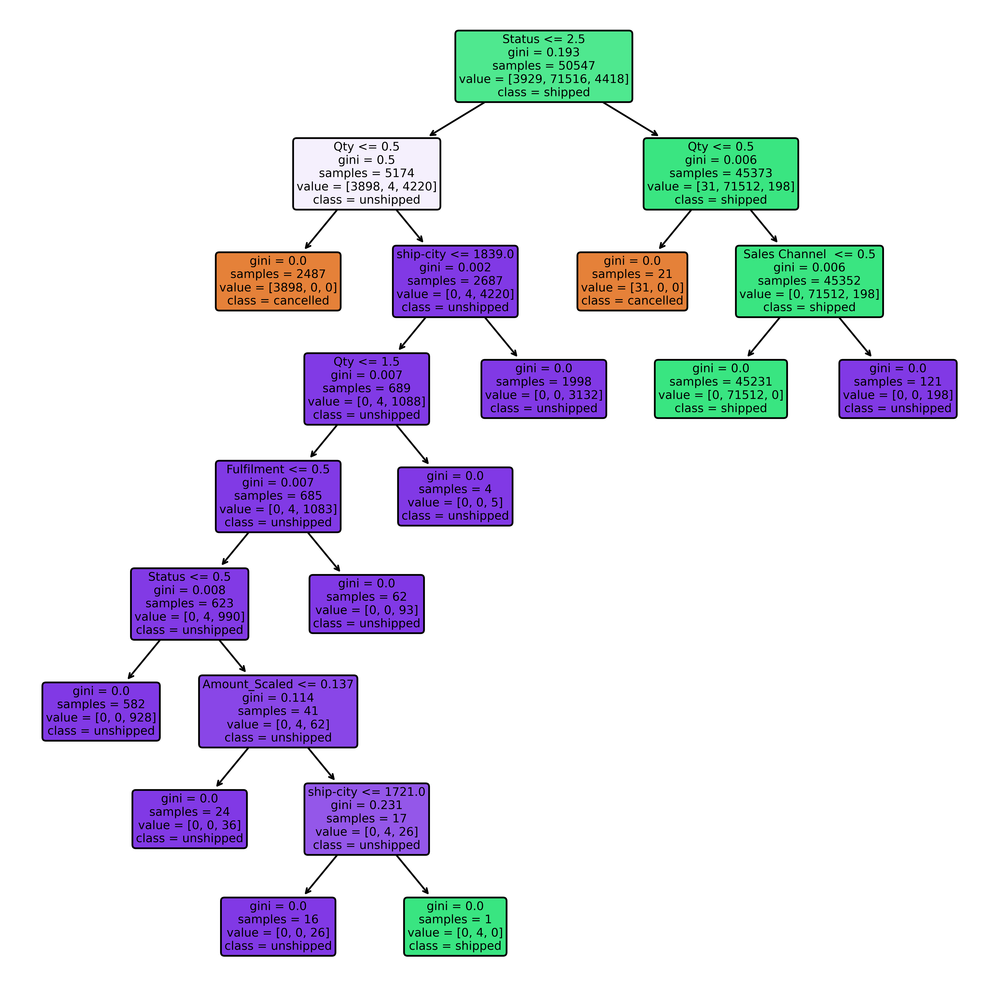

In [94]:
for index in range(0, 3):
    visualise_tree(clf.estimators_[index])

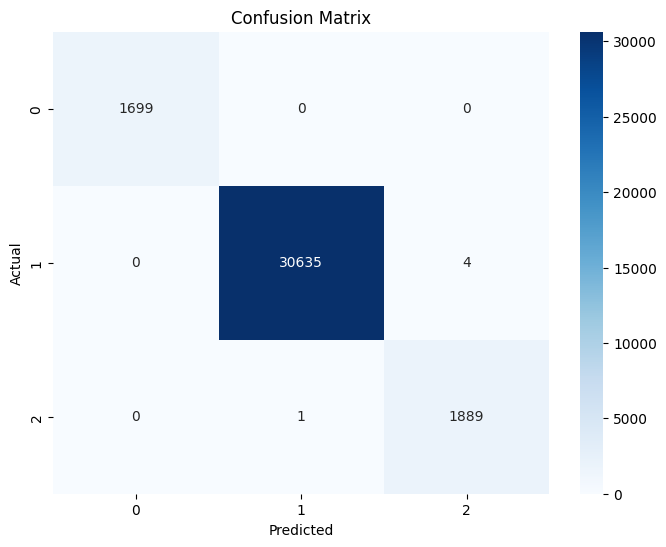

In [103]:
cm = confusion_matrix(y_test,y_test_pred4)

# Plot heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

In [95]:
from sklearn.linear_model import LogisticRegression



# Create a logistic regression model with Ridge regularization
model = LogisticRegression(penalty='l2')

# Fit the model to the training data
model.fit(x_train, y_train)

# Make predictions on the test data
y_pred = model.predict(x_test)

# Evaluate the model's performance
# (You can use metrics like accuracy, precision, recall, etc.)

In [96]:
y_trainp = model.predict(x_train)


In [97]:
print('Accuracy Score on train data: ', metrics.accuracy_score(y_train, y_trainp))
print("Random Forest test Accuracy:", metrics.accuracy_score(y_test, y_pred))

Accuracy Score on train data:  0.9548476766462567
Random Forest test Accuracy: 0.9544817108799813


In [98]:


# Create a logistic regression model with Lasso regularization
model2 = LogisticRegression(penalty='l1', solver='liblinear')

# Fit the model to the training data
model2.fit(x_train, y_train)

# Make predictions on the test data
y_prede = model.predict(x_test)

# Evaluate the model's performance
# (You can use metrics like accuracy, precision, recall, etc.)


In [99]:
y_traine = model2.predict(x_train)


In [100]:
print('Accuracy Score on train data: ', metrics.accuracy_score(y_train, y_traine))
print("Random Forest test Accuracy:", metrics.accuracy_score(y_test, y_prede))

Accuracy Score on train data:  0.9999749571140578
Random Forest test Accuracy: 0.9544817108799813


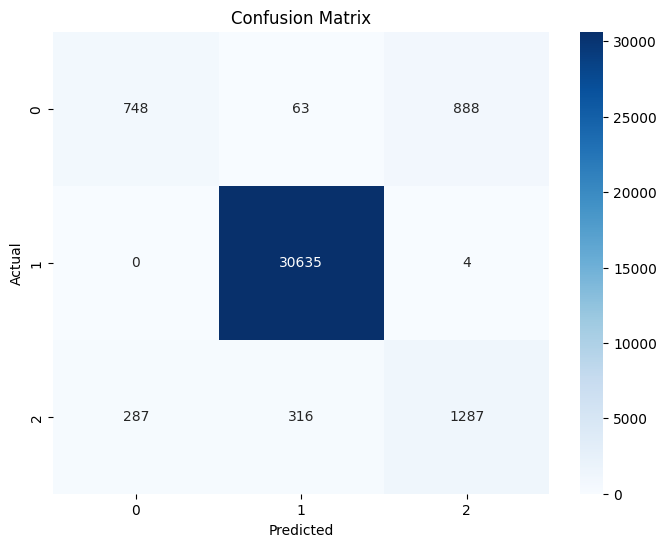

In [102]:
cm = confusion_matrix(y_test,y_prede)

# Plot heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()